In [1]:
#import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

import warnings
warnings.filterwarnings('ignore')

In [11]:
#Read the data into a dataframe 'cars'
cars=pd.read_csv('usedcars00_data.csv',na_values=['','--'])
cars

,Unnamed: 0,Title,Year,Model,Fuel,Distance Travelled,Transmission,Location,Owner,Price
0,0,Maruti Suzuki Swift,2019.0,DDiS VDI,DIESEL,70000.0 KM,MANUAL,Hyderabad,1st,"6,80,000"
1,1,Maruti Suzuki Ciaz,2017.0,1.3 Alpha,DIESEL,54000.0 KM,MANUAL,Hyderabad,1st,"8,75,000"
2,2,Hyundai Venue,2019.0,SX Opt Diesel,DIESEL,23247.0 KM,MANUAL,Hyderabad,1st,"11,75,000"
3,3,Hyundai Santro Xing,2005.0,XP,PETROL/LIQUIFIED PETROLEUM GAS,78001 KM,MANUAL,Hyderabad,Fourth,"1,25,000"
4,4,Mahindra Xylo,2012.0,2012-2014 E9,DIESEL,132647 KM,MANUAL,Hyderabad,Third,"6,25,000"
5,5,Skoda Laura,2010.0,Ambition 2.0 TDI CR AT,DIESEL,92000.0 KM,AUTOMATIC,Hyderabad,1st,"4,20,000"
6,6,Hyundai Santa Fe,2013.0,2009-2013 4X2,DIESEL,88000.0 KM,MANUAL,Hyderabad,1st,"7,99,000"
7,7,Toyota Etios,2010.0,2010-2012 VX,PETROL,44000.0 KM,MANUAL,Hyderabad,1st,"3,55,000"
8,8,Mahindra Bolero Pik-Up,2019.0,CBC 1.7T,DIESEL,35168.0 KM,MANUAL,Hyderabad,1st,"7,50,000"
9,9,Volkswagen Polo,2021.0,GT TSI,PETROL,8000.0 KM,AUTOMATIC,Hyderabad,1st,"9,85,000"


# EDA

In [12]:
cars.shape

(5787, 10)

In [13]:
cars.isnull().sum()

Unnamed: 0              0
Title                  95
Year                   95
Model                 388
Fuel                  223
Distance Travelled     95
Transmission          364
Location               95
Owner                 341
Price                  95
dtype: int64

In [14]:
cars.dropna(axis=0,how='any',inplace=True)

In [15]:
cars.shape

(5133, 10)

In [16]:
cars1=cars.copy()

In [17]:
cars.drop(columns=['Unnamed: 0','Model'],inplace=True)

In [18]:
cars.shape

(5133, 8)

In [19]:
cars.columns

Index(['Title', 'Year', 'Fuel', 'Distance Travelled', 'Transmission',
       'Location', 'Owner', 'Price'],
      dtype='object')

In [33]:
cars.reset_index(drop=True,inplace=True)

In [44]:
brand=[]
name=[]
for i in range(5133):
    brand.append(cars['Title'][i].split()[0])
    name.append(' '.join(cars['Title'][i].split()[1:]))

In [45]:
cars['Brand']=brand
cars['Name']=name

In [52]:
cars.drop(columns=['Title'],inplace=True)

In [53]:
cars

,Year,Fuel,Distance Travelled,Transmission,Location,Owner,Price,Brand,Name
0,2019.0,DIESEL,70000.0 KM,MANUAL,Hyderabad,1st,"6,80,000",Maruti,Suzuki Swift
1,2017.0,DIESEL,54000.0 KM,MANUAL,Hyderabad,1st,"8,75,000",Maruti,Suzuki Ciaz
2,2019.0,DIESEL,23247.0 KM,MANUAL,Hyderabad,1st,"11,75,000",Hyundai,Venue
3,2005.0,PETROL/LIQUIFIED PETROLEUM GAS,78001 KM,MANUAL,Hyderabad,Fourth,"1,25,000",Hyundai,Santro Xing
4,2012.0,DIESEL,132647 KM,MANUAL,Hyderabad,Third,"6,25,000",Mahindra,Xylo
5,2010.0,DIESEL,92000.0 KM,AUTOMATIC,Hyderabad,1st,"4,20,000",Skoda,Laura
6,2013.0,DIESEL,88000.0 KM,MANUAL,Hyderabad,1st,"7,99,000",Hyundai,Santa Fe
7,2010.0,PETROL,44000.0 KM,MANUAL,Hyderabad,1st,"3,55,000",Toyota,Etios
8,2019.0,DIESEL,35168.0 KM,MANUAL,Hyderabad,1st,"7,50,000",Mahindra,Bolero Pik-Up
9,2021.0,PETROL,8000.0 KM,AUTOMATIC,Hyderabad,1st,"9,85,000",Volkswagen,Polo


In [56]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5133 entries, 0 to 5132
Data columns (total 9 columns):
Year                  5133 non-null float64
Fuel                  5133 non-null object
Distance Travelled    5133 non-null object
Transmission          5133 non-null object
Location              5133 non-null object
Owner                 5133 non-null object
Price                 5133 non-null object
Brand                 5133 non-null object
Name                  5133 non-null object
dtypes: float64(1), object(8)
memory usage: 361.0+ KB


In [57]:
cars['Year']=cars['Year'].astype(int)

In [58]:
cars['Years Old']=2022-cars['Year']

In [59]:
cars.head(20)

,Year,Fuel,Distance Travelled,Transmission,Location,Owner,Price,Brand,Name,Years Old
0,2019,DIESEL,70000.0 KM,MANUAL,Hyderabad,1st,"6,80,000",Maruti,Suzuki Swift,3
1,2017,DIESEL,54000.0 KM,MANUAL,Hyderabad,1st,"8,75,000",Maruti,Suzuki Ciaz,5
2,2019,DIESEL,23247.0 KM,MANUAL,Hyderabad,1st,"11,75,000",Hyundai,Venue,3
3,2005,PETROL/LIQUIFIED PETROLEUM GAS,78001 KM,MANUAL,Hyderabad,Fourth,"1,25,000",Hyundai,Santro Xing,17
4,2012,DIESEL,132647 KM,MANUAL,Hyderabad,Third,"6,25,000",Mahindra,Xylo,10
5,2010,DIESEL,92000.0 KM,AUTOMATIC,Hyderabad,1st,"4,20,000",Skoda,Laura,12
6,2013,DIESEL,88000.0 KM,MANUAL,Hyderabad,1st,"7,99,000",Hyundai,Santa Fe,9
7,2010,PETROL,44000.0 KM,MANUAL,Hyderabad,1st,"3,55,000",Toyota,Etios,12
8,2019,DIESEL,35168.0 KM,MANUAL,Hyderabad,1st,"7,50,000",Mahindra,Bolero Pik-Up,3
9,2021,PETROL,8000.0 KM,AUTOMATIC,Hyderabad,1st,"9,85,000",Volkswagen,Polo,1


In [62]:
for i in range(5133):
    cars['Distance Travelled'][i]=cars['Distance Travelled'][i].strip('KM')

In [63]:
cars.head()

,Year,Fuel,Distance Travelled,Transmission,Location,Owner,Price,Brand,Name,Years Old
0,2019,DIESEL,70000.0,MANUAL,Hyderabad,1st,"6,80,000",Maruti,Suzuki Swift,3
1,2017,DIESEL,54000.0,MANUAL,Hyderabad,1st,"8,75,000",Maruti,Suzuki Ciaz,5
2,2019,DIESEL,23247.0,MANUAL,Hyderabad,1st,"11,75,000",Hyundai,Venue,3
3,2005,PETROL/LIQUIFIED PETROLEUM GAS,78001,MANUAL,Hyderabad,Fourth,"1,25,000",Hyundai,Santro Xing,17
4,2012,DIESEL,132647,MANUAL,Hyderabad,Third,"6,25,000",Mahindra,Xylo,10


In [64]:
cars['Owner'].unique()

array(['1st', 'Fourth', 'Third', '2nd', 'Second', '4th', 'First', '3rd',
       '4+'], dtype=object)

In [65]:
cars['Owner']=cars['Owner'].map({'1st':1,'Fourth':4,'Third':3,'2nd':2,'Second':2,'4th':4,'First':1,'3rd':3,'4+':5})

In [67]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5133 entries, 0 to 5132
Data columns (total 10 columns):
Year                  5133 non-null int32
Fuel                  5133 non-null object
Distance Travelled    5133 non-null object
Transmission          5133 non-null object
Location              5133 non-null object
Owner                 5133 non-null int64
Price                 5133 non-null object
Brand                 5133 non-null object
Name                  5133 non-null object
Years Old             5133 non-null int32
dtypes: int32(2), int64(1), object(7)
memory usage: 361.0+ KB


In [68]:
cars

,Year,Fuel,Distance Travelled,Transmission,Location,Owner,Price,Brand,Name,Years Old
0,2019,DIESEL,70000.0,MANUAL,Hyderabad,1,"6,80,000",Maruti,Suzuki Swift,3
1,2017,DIESEL,54000.0,MANUAL,Hyderabad,1,"8,75,000",Maruti,Suzuki Ciaz,5
2,2019,DIESEL,23247.0,MANUAL,Hyderabad,1,"11,75,000",Hyundai,Venue,3
3,2005,PETROL/LIQUIFIED PETROLEUM GAS,78001,MANUAL,Hyderabad,4,"1,25,000",Hyundai,Santro Xing,17
4,2012,DIESEL,132647,MANUAL,Hyderabad,3,"6,25,000",Mahindra,Xylo,10
5,2010,DIESEL,92000.0,AUTOMATIC,Hyderabad,1,"4,20,000",Skoda,Laura,12
6,2013,DIESEL,88000.0,MANUAL,Hyderabad,1,"7,99,000",Hyundai,Santa Fe,9
7,2010,PETROL,44000.0,MANUAL,Hyderabad,1,"3,55,000",Toyota,Etios,12
8,2019,DIESEL,35168.0,MANUAL,Hyderabad,1,"7,50,000",Mahindra,Bolero Pik-Up,3
9,2021,PETROL,8000.0,AUTOMATIC,Hyderabad,1,"9,85,000",Volkswagen,Polo,1


In [95]:
for i in range(5133):
    cars['Price'][i]=cars['Price'][i].replace(',','')
    

AttributeError: 'numpy.int32' object has no attribute 'replace'

In [96]:
for i in range(5133):
    cars['Distance Travelled'][i]=cars['Distance Travelled'][i].replace(',','')

In [99]:
cars.head()

,Year,Fuel,Distance Travelled,Transmission,Location,Owner,Price,Brand,Name,Years Old
0,2019,DIESEL,70000.0,MANUAL,Hyderabad,1,680000,Maruti,Suzuki Swift,3
1,2017,DIESEL,54000.0,MANUAL,Hyderabad,1,875000,Maruti,Suzuki Ciaz,5
2,2019,DIESEL,23247.0,MANUAL,Hyderabad,1,1175000,Hyundai,Venue,3
3,2005,PETROL/LIQUIFIED PETROLEUM GAS,78001.0,MANUAL,Hyderabad,4,125000,Hyundai,Santro Xing,17
4,2012,DIESEL,132647.0,MANUAL,Hyderabad,3,625000,Mahindra,Xylo,10


In [106]:
cars['Price']=cars['Price'].astype(float)
cars['Distance Travelled']=cars['Distance Travelled'].astype(float)

In [107]:
cars['Price in Lakhs']=cars['Price']/100000
cars['Distance Travelled in Lakhs KM']=cars['Distance Travelled']/10000

In [108]:
cars.head(10)

,Fuel,Distance Travelled,Transmission,Owner,Price,Brand,Name,Years Old,Price in Lakhs,Distance Travelled in Lakhs KM
0,DIESEL,70000.0,MANUAL,1,680000.0,Maruti,Suzuki Swift,3,6.80,7.0000
1,DIESEL,54000.0,MANUAL,1,875000.0,Maruti,Suzuki Ciaz,5,8.75,5.4000
2,DIESEL,23247.0,MANUAL,1,1175000.0,Hyundai,Venue,3,11.75,2.3247
3,PETROL/LIQUIFIED PETROLEUM GAS,78001.0,MANUAL,4,125000.0,Hyundai,Santro Xing,17,1.25,7.8001
4,DIESEL,132647.0,MANUAL,3,625000.0,Mahindra,Xylo,10,6.25,13.2647
5,DIESEL,92000.0,AUTOMATIC,1,420000.0,Skoda,Laura,12,4.20,9.2000
6,DIESEL,88000.0,MANUAL,1,799000.0,Hyundai,Santa Fe,9,7.99,8.8000
7,PETROL,44000.0,MANUAL,1,355000.0,Toyota,Etios,12,3.55,4.4000
8,DIESEL,35168.0,MANUAL,1,750000.0,Mahindra,Bolero Pik-Up,3,7.50,3.5168
9,PETROL,8000.0,AUTOMATIC,1,985000.0,Volkswagen,Polo,1,9.85,0.8000


'Location' is not required. Drop 'Year', 'Location','Price','Distance Travelled'

In [100]:
cars.drop(columns=['Year','Location','Price','Distance Travelled'],inplace=True)

In [109]:
cars.drop(columns=['Price','Distance Travelled'],inplace=True)

In [110]:
cars.shape

(5133, 8)

In [111]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5133 entries, 0 to 5132
Data columns (total 8 columns):
Fuel                              5133 non-null object
Transmission                      5133 non-null object
Owner                             5133 non-null int64
Brand                             5133 non-null object
Name                              5133 non-null object
Years Old                         5133 non-null int32
Price in Lakhs                    5133 non-null float64
Distance Travelled in Lakhs KM    5133 non-null float64
dtypes: float64(2), int32(1), int64(1), object(4)
memory usage: 300.8+ KB


In [47]:
cars['Brand'].nunique()

37

In [49]:
cars['Brand'].unique()

array(['Maruti', 'Hyundai', 'Mahindra', 'Skoda', 'Toyota', 'Volkswagen',
       'Honda', 'Kia', 'Ford', 'Tata', 'Audi', 'Volvo', 'Renault',
       'Mercedes-Benz', 'Mg', 'Datsun', 'Bmw', 'Chevrolet', 'Nissan',
       'Mitsubishi', 'Mini', 'Jeep', 'Land', 'Fiat', 'Jaguar', 'Porsche',
       'Mercedes', 'Force', 'Isuzu', 'Bajaj', 'Ambassador', 'Ssangyong',
       'Other', 'Opel', 'Bentley', 'Hindustan', 'Premier'], dtype=object)

In [103]:
cars['Brand']=cars['Brand'].replace('Mercedes-Benz','Mercedes')

In [105]:
cars['Brand'].nunique()

36

In [50]:
cars['Name'].nunique()

303

In [51]:
cars['Name'].unique()

array(['Suzuki Swift', 'Suzuki Ciaz', 'Venue', 'Santro Xing', 'Xylo',
       'Laura', 'Santa Fe', 'Etios', 'Bolero Pik-Up', 'Polo', 'Verna',
       'I20', 'Suzuki Celerio', 'Brio', 'Seltos', 'I10', 'Suzuki Sx4',
       'Suzuki Wagon R', 'Suzuki A-Star', 'Figo', 'Suzuki Estilo',
       'Accord', 'Jazz', 'Indica', 'Marazzo', 'Suzuki Swift Dzire',
       'Camry', 'Suzuki Ertiga', 'Suzuki Omni', 'Ecosport', 'Q5', 'S60',
       'Kwid', 'Xcent', 'E-Class', 'Q3', 'Manza', 'Xuv500', 'Hector',
       'Suzuki Swift Dzire Tour', 'Fortuner', 'Indica V2', 'Creta',
       'Suzuki Ritz', 'Redigo', 'Suzuki Baleno', '5 Series', 'Innova',
       'Fluidic Verna', 'Innova Crysta', 'Suzuki Vitara Brezza', 'City',
       'Indigo', 'Optra Magnum', 'Octavia', 'Micra', 'Grand I10',
       'Suzuki Alto', 'Suzuki Alto 800', 'Suzuki S-Cross', 'Amaze',
       'Bolero', 'Terrano', 'Endeavour', 'Gla Class', 'Ikon',
       'Indica Ev2', 'S 80', 'Eon', 'Pajero', 'Duster', 'Superb',
       'Etios Liva', 'Cooper Country

In [112]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5133 entries, 0 to 5132
Data columns (total 8 columns):
Fuel                              5133 non-null object
Transmission                      5133 non-null object
Owner                             5133 non-null int64
Brand                             5133 non-null object
Name                              5133 non-null object
Years Old                         5133 non-null int32
Price in Lakhs                    5133 non-null float64
Distance Travelled in Lakhs KM    5133 non-null float64
dtypes: float64(2), int32(1), int64(1), object(4)
memory usage: 300.8+ KB


# Data Visualisation

Continous Columns. Price is the target column

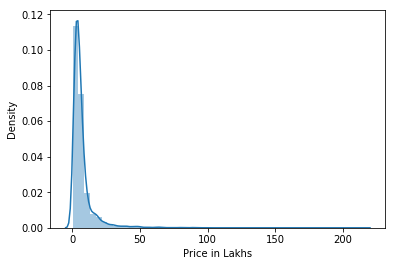

In [113]:
sns.distplot(cars['Price in Lakhs'],kde=True)

Price Data is right skewed

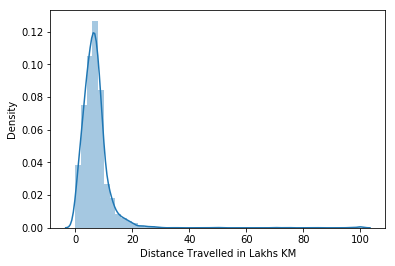

In [114]:
sns.distplot(cars['Distance Travelled in Lakhs KM'],kde=True)

Distance Travelled data is right skewed

Categorical Columns

In [115]:
cars.columns

Index(['Fuel', 'Transmission', 'Owner', 'Brand', 'Name', 'Years Old',
       'Price in Lakhs', 'Distance Travelled in Lakhs KM'],
      dtype='object')

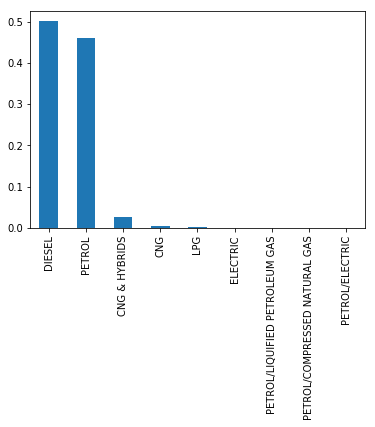

In [119]:
cars['Fuel'].value_counts(normalize=True).plot(kind='bar')

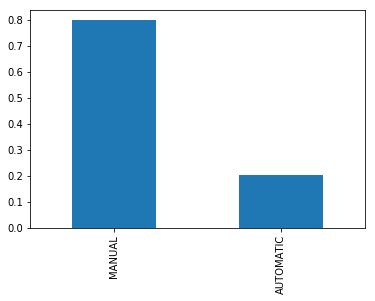

In [120]:
cars['Transmission'].value_counts(normalize=True).plot(kind='bar')

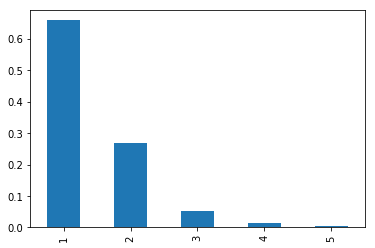

In [121]:
cars['Owner'].value_counts(normalize=True).plot(kind='bar')

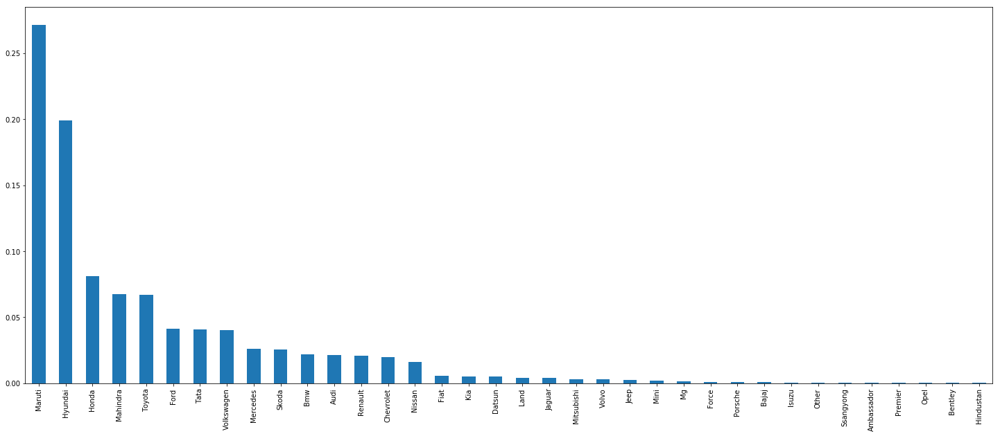

In [122]:
plt.figure(figsize=(25,10))
cars['Brand'].value_counts(normalize=True).plot(kind='bar')

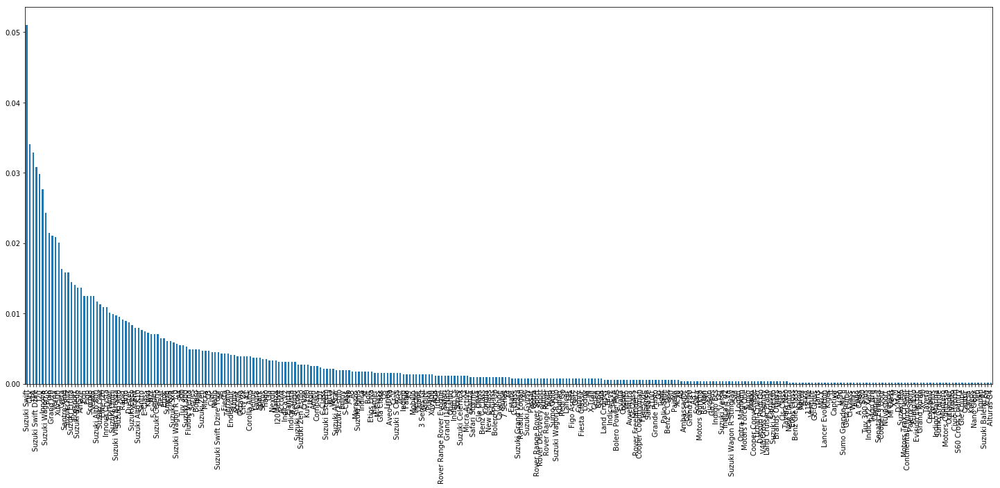

In [123]:
plt.figure(figsize=(25,10))
cars['Name'].value_counts(normalize=True).plot(kind='bar')

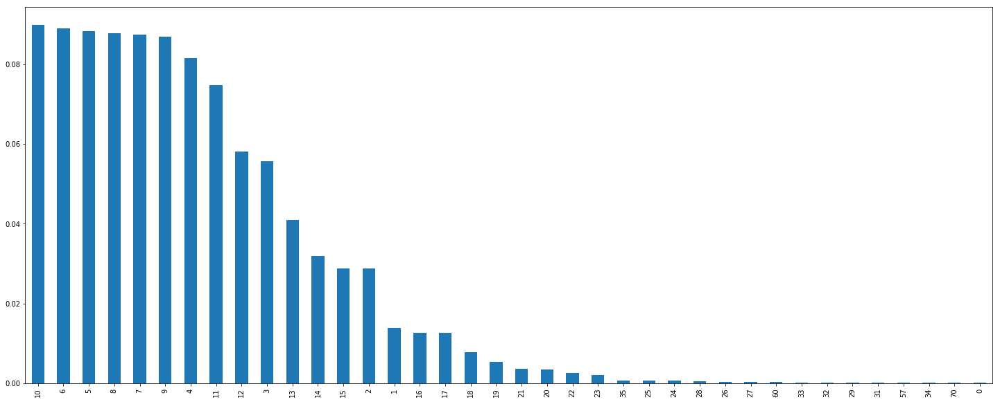

In [124]:
plt.figure(figsize=(25,10))
cars['Years Old'].value_counts(normalize=True).plot(kind='bar')

Majority of the cars use fuel Petrol and Deisel

Manual cars are more in number than Automatic cars

First hand cars are maximum followed by second hand

Maruthi and Hyundai are the most bought cars

Most of the cars are of age 4-11 years

Effect of features on target column

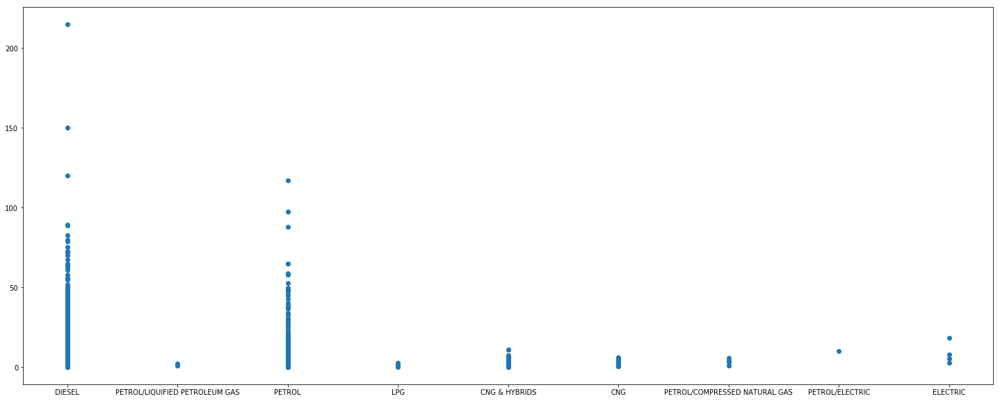

In [128]:
plt.figure(figsize=(25,10))
plt.scatter(cars['Fuel'],cars['Price in Lakhs'])

Petrol and Deisel cars are costlier

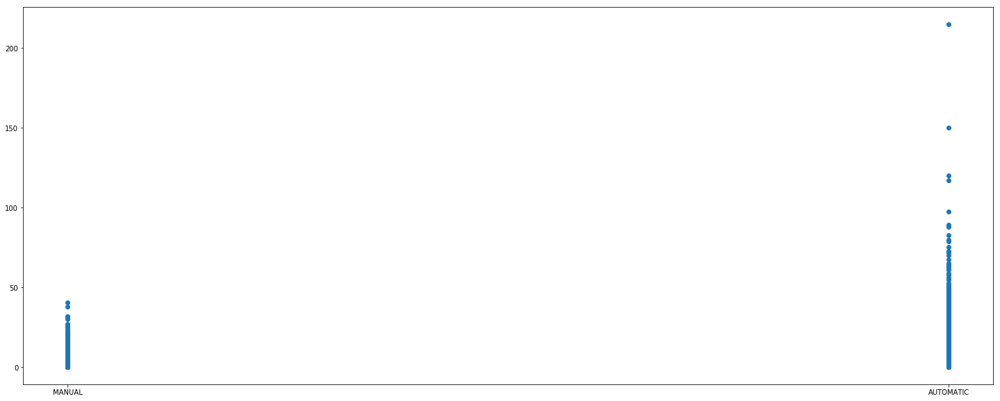

In [129]:
plt.figure(figsize=(25,10))
plt.scatter(cars['Transmission'],cars['Price in Lakhs'])

Automatic cars are costlier

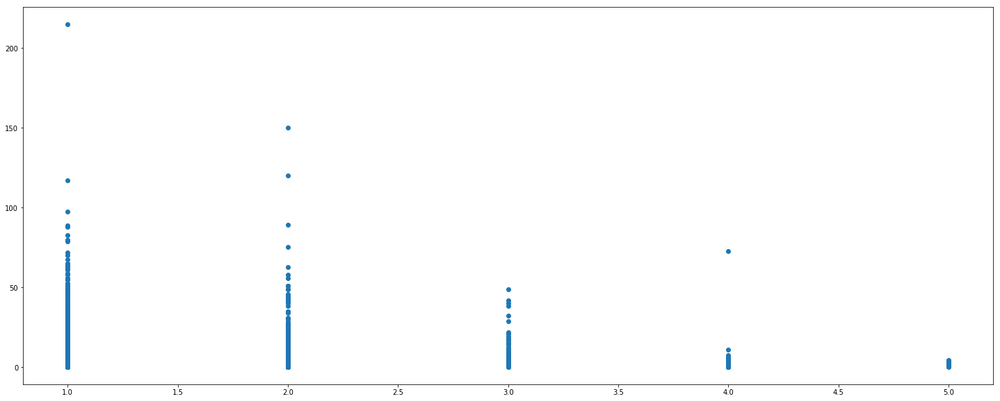

In [130]:
plt.figure(figsize=(25,10))
plt.scatter(cars['Owner'],cars['Price in Lakhs'])

It can be seen that as the number of owners increases price decreases.

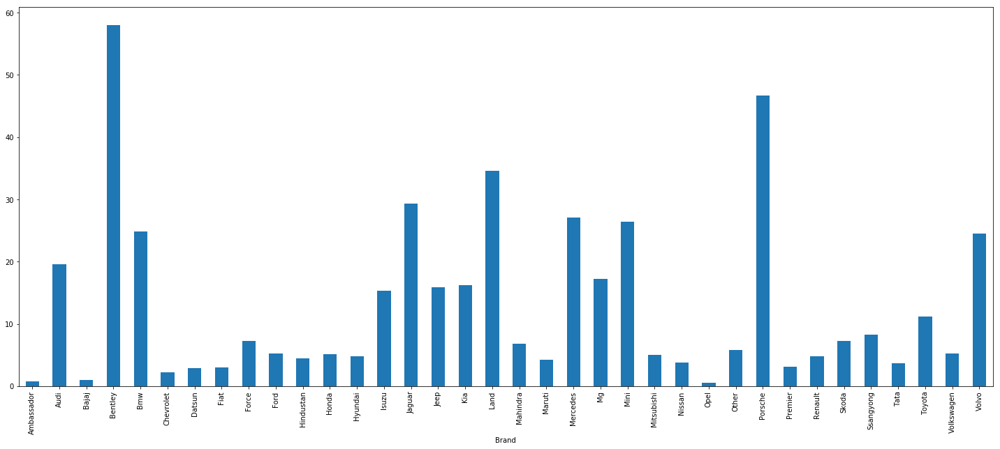

In [131]:
plt.figure(figsize=(25,10))
data=cars.groupby('Brand')['Price in Lakhs'].mean()
data.plot(kind='bar')

It can be seen that price varies with brand, Bentley being the costliest followed by Porsche

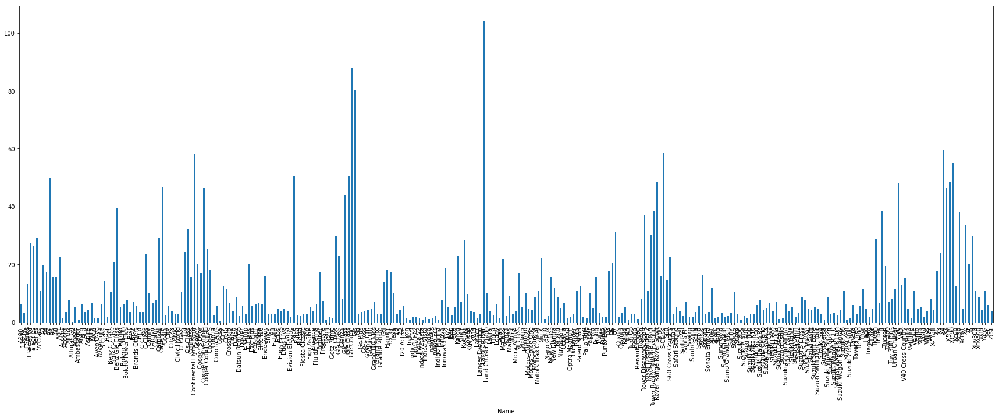

In [132]:
plt.figure(figsize=(30,10))
data=cars.groupby('Name')['Price in Lakhs'].mean()
data.plot(kind='bar')

It can be seen that car name (which gives information on the model,hatchback or sedan,seater) has an effect on Price.

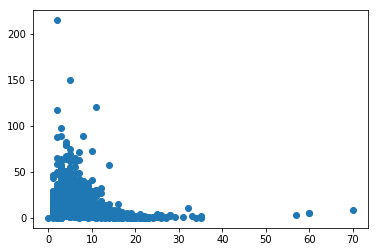

In [134]:

plt.scatter(cars['Years Old'],cars['Price in Lakhs'])

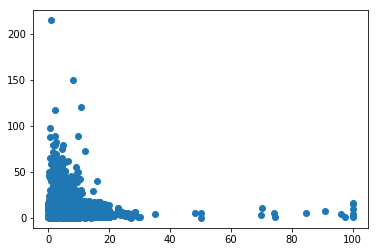

In [135]:
plt.scatter(cars['Distance Travelled in Lakhs KM'],cars['Price in Lakhs'])

As the distance increases price decreases